In [1]:
#basic importing
import os
import sys
path1=sys.path.append('/u/vasulkar/p_emodnet_amey/Regional_canada_model/')
from IPython.display import Image
from IPython.core.display import HTML 
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, MultiPolygon, shape
import shapefile

import cartopy.crs as ccrs
import cartopy.feature as cpf 
from global_land_mask import globe
import pandas as pd
import os
import pyproj
from osgeo import ogr
from osgeo import gdal
import fiona
from shapely.geometry import shape,mapping, Point, Polygon, MultiPolygon
gdal.UseExceptions()
from pyproj import Proj, transform
from cartopy.feature import ShapelyFeature
import cmocean

Based on the previous worksheet it was clear that the viscosity values were very high. So, now we use another approach with some dimensional analysis. 
The idea is that when the horizontal shear cannot be larger than the vertical shear for the dynamical equations to hold valid in our 2D integrated model. 
Since our approach is to add to the existing viscosity the horizontal shear from sea ice, it turns out that adding excess viscosity to the term makes the modelling difficult to converge and some other issues like the calibration is not correct. 

So, we perform a dimensional analysis and check the limiting value of viscosity.

$\mathbb{X}=\frac{\nabla \sigma}{\rho_wC_wU^2}$
Now $X~1$ is when the two forces are almost the same and we switch to the other forcing when $X>>1$. 
With this in mind, let us see the equations for $\sigma$. 

$\nabla \sigma=\eta_i \nabla^2 u,$
where $\eta_i=\frac{P_s h_i e^{-C(1-A)}}{2\Delta_o e^2}.$
Using the dimensional Analysis,
$$\rho_w C_w U^2\sim \frac{\eta U }{L^2},$$
$$\eta \sim \rho_w C_w U *L^2$$
Now, considering $U=0.1m/s$, $C_w=5.5\times10^-3$, and $L=1.25km$ as the shortest grid size. 



In [2]:
rho_w=1024.0
C_w=5.5e-03
L=1.25*1000
U=1.0
mu_max=rho_w*C_w*U*L*L
print(mu_max)

8800000.0


Classification based on viscosity.

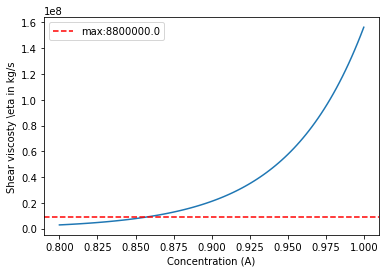

In [3]:
h=1
#trying to plot the viscosity for varying ice concentraion to get an idea.
A=np.linspace(0.8,1,101)
visvec=(25e03*h/(2*2e-05*4))*np.exp(-20*(1-A))
fig=plt.figure()
plt.plot(A,visvec)
plt.xlabel('Concentration (A)')
plt.ylabel('Shear viscosty \eta in kg/s')
plt.axhline(y = mu_max, color = 'r', linestyle = '--',label='max:'+str(mu_max))
plt.legend()
plt.savefig('Ice Parameters/Viscosity_Classification.jpg')

But we could also represent in terms of $\mathbb{X}$, as:
$$\mathbb{X}=\frac{\eta (h_i,A)}{\rho_w C_w L^2 U}$$
$$\Rightarrow\mathbb{X}=\frac{\eta (h_i,A)}{8.8\times 10^{8}}$$
This means, $\mathbb{X}$ is a function of $h_i$ and $A$ and can be obtained by substituting for $\eta$. 
Thus, we have,
$$\mathbb{X}=\frac{P^*h_ie^{-C(1-A)}}{4\Delta_o e^2*8.8\times 10^{8}}$$
Subsituting $P=25kPa$, $e=2$, $C=20$ and $\Delta_o=1e-05$ we get $\mathbb{X}$ as,


In [7]:
K=(25*1000)/(4*4e-05)
K1=K/(8.8e06)
print(K)
print(K1)

156250000.0
17.755681818181817


$$\mathbb{X}=K h_i e^{-C(1-A)},$$
with $K=17.75$ as evaluated above. 
Now let us plot X and find the point where $X=1$. 

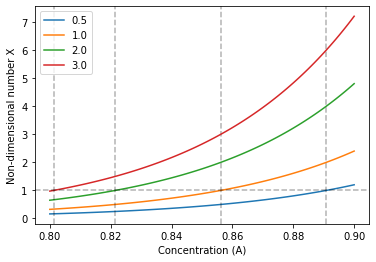

In [11]:

#trying to plot the dimensionless X for varying ice concentraion to get an idea.
A=np.linspace(0.8,0.9,101)
hvec=[0.5,1.0,2.0,3.0]
fig=plt.figure()
for i in range(len(hvec)):
    hi=hvec[i]
    Xvec=K1*hi*np.exp(-20*(1-A))
    #obtaining concentrations at various thickness where eta_max is reached.
    Ac=1-(-1/20)*np.log(1/(K1*hi))
    plt.plot(A,Xvec,label=str(hi))
    plt.axvline(Ac,color='black',linestyle='--',alpha=0.3)
    plt.xlabel('Concentration (A)')
    plt.ylabel('Non-dimensional number X')
plt.axhline(y = 1.0, color = 'black', linestyle = '--',alpha=0.3)
plt.legend()
plt.savefig('Ice Parameters/DimensionalessXClassification.jpg')

In [13]:
#get the projected buff file which gives us the polygon on ice cover. 
#now depending on march and september we have different files. Also, for march we will have the friction term too.
month='Mar'
typ='all_ice'
if month=='Sep':
    # prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer_proj.shp'
    # buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer.shp'
    prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/all_ice/Buffer_proj.shp'
    buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/all_ice/Buffer.shp'

else:
    buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/tc_mid/Buffer.shp'
    prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/tc_mid/Buffer_proj.shp'
    if typ=='all_ice':
    #all ice
        prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/all_ice/Buffer_proj.shp'
        buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/all_ice/Buffer.shp'
# reader=shapefile.Reader(buffile)
# multipol=shape(reader.shape())
multipolcollection = fiona.open(buffile)
# multipolprj=fiona.open(prjbuffile)
for record in multipolcollection:
    multipol= shape(record['geometry'])   # only one feature in the shapefile

multipol

In [70]:
fname='Ice Parameters/icepolygonpoints_'+month+'.xyz'
print(fname)
# fname='icepolygonpoints_march_14.xyz'
headerlist=['Lon','Lat','pid']
df=pd.read_csv(fname,names=headerlist,delim_whitespace=True)
df.head()
icepollonpointvec=np.array(df['Lon'])
icepollatpointvec=np.array(df['Lat'])
icepid=np.array(df['pid'])
#now based on paramid, we  get the index of all the inpolygon points.

inicepolindex=np.where(icepid==1.)[0]

Ice Parameters/icepolygonpoints_Mar.xyz


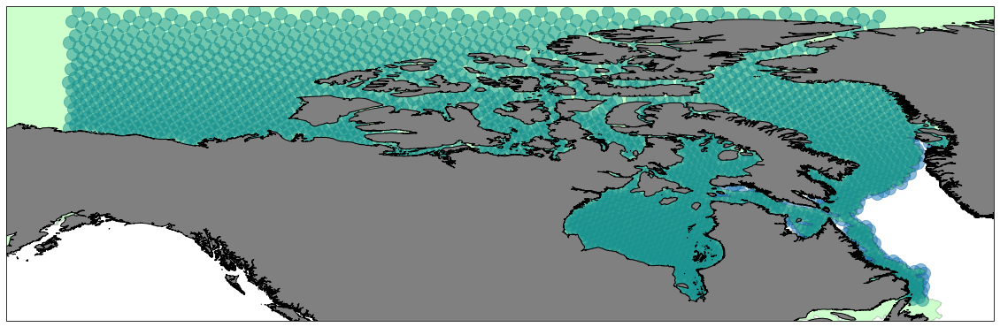

In [73]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
ax1.scatter(icepollonpointvec[inicepolindex],icepollatpointvec[inicepolindex],transform=ccrs.PlateCarree(),s=200,alpha=0.5)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
# ax1.scatter(icepollonpointvec,icepollatpointvec,transform=ccrs.PlateCarree(),s=3)
# fig.savefig('Ice Parameters/All_Ice_'+month+'.jpg',dpi=1000)

Now the idea is to compute viscosity at all the points and then divide into fast ice and non fast ice regions.
Getting the ice thickness and ice concentration from CMEMS global ocean reanlaysis product. 
https://resources.marine.copernicus.eu/product-detail/GLOBAL_MULTIYEAR_PHY_001_030/INFORMATION

But above product was only till july 2020. so we used:

https://resources.marine.copernicus.eu/product-detail/ARCTIC_MULTIYEAR_PHY_002_003/INFORMATION

but turns out this is in polar stereographic north coordinates. :)

In [13]:
if month=='Sep':
#sept
    sitfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650276570205.nc'
#march
else:
    sitfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650373925748.nc'
sitdata=xr.open_dataset(sitfile)
print(sitdata)
sitlon=np.array(sitdata.longitude.values).ravel()
sitlat=np.array(sitdata.latitude.values).ravel()
sit=sitdata.sithick.values[0,:,:]
sit=sit.ravel()
sit=np.where((np.isnan(sit)==True),0,sit)
#may be smart to convert nan to 0?
# print(sit)
#interpolate the sit data to the points within the ice cover from NSIDC. 
#inicelon and inicelat are the vectors.
from scipy.interpolate import NearestNDInterpolator 
# #nearest interpolator is used because of a lot of nan values around. and interpolation really makes it smooth. which we don't want. 
interpfunc=NearestNDInterpolator(list(zip(sitlon,sitlat)),sit)
siti=interpfunc(icepollonpointvec[inicepolindex],icepollatpointvec[inicepolindex])
# siti=siti[:,0]
#above is for a 2D grid.

<xarray.Dataset>
Dimensions:        (time: 1, x: 609, y: 845)
Coordinates:
    latitude       (y, x) float32 ...
  * x              (x) float32 -38.0 -37.88 -37.75 -37.62 ... 37.75 37.88 38.0
  * y              (y) float32 -52.75 -52.62 -52.5 -52.38 ... 52.5 52.62 52.75
  * time           (time) datetime64[ns] 2020-03-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    sithick        (time, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    ver

In [14]:
#sept
if month=='Sep':
    sicfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650276490073.nc'
#march
else:
    sicfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650373962695.nc'
sicdata=xr.open_dataset(sicfile)
print(sicdata)

siclon=np.array(sicdata.longitude.values).ravel()
siclat=np.array(sicdata.latitude.values).ravel()
sic=sicdata.siconc.values[0,:,:]
sic=np.array(sic).ravel()
sic=np.where((np.isnan(sic)==True),0,sic)
#may be smart to convert nan to 0?
# print(sic)
interpfunc=NearestNDInterpolator(list(zip(siclon,siclat)),sic)
sici=interpfunc(icepollonpointvec[inicepolindex],icepollatpointvec[inicepolindex])
#1d vec


<xarray.Dataset>
Dimensions:        (time: 1, x: 609, y: 845)
Coordinates:
    latitude       (y, x) float32 ...
  * x              (x) float32 -38.0 -37.88 -37.75 -37.62 ... 37.75 37.88 38.0
  * y              (y) float32 -52.75 -52.62 -52.5 -52.38 ... 52.5 52.62 52.75
  * time           (time) datetime64[ns] 2020-03-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    siconc         (time, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    ver

Now we compute viscosity using siti and sici.

In [15]:
#shear and bulk viscosities of sea ice EVP and shiming yu ppt
#standard values.
def computeiceviscosity(sic,sit):
    P_s=25e03
    #deltao=2e-09
    #but turns out for central arctic a value of e-07 is oberves
    #references like kwok et al 2003 and luneva saw 10-7 to 10^-6
    #deltao must be much smaller than typical strain rate values. 3But deltao =1e-05 is for liear law
    deltao=1e-05
    e=2.
    C=20.
    #Start by computing P
    #P=P_s*h*np.exp(-C(1-A))
    Pvec=[]
    for i in range(len(sit)):
        h=sit[i]
        A=sic[i]
        if (A>0.0) and (h>0.0):
            print(A,h)   #only using ice  concentration A>0.0 and h>0.0.
            P=P_s*h*np.exp(-C*(1-A))
            Pvec=np.append(Pvec,P)
        else:
            Pvec=np.append(Pvec,0)
    etaivec=Pvec/(4*deltao*e**2)
    etaivec=etaivec
    return(etaivec)

etaivec=computeiceviscosity(sici,siti)

0.77496725 0.18016613
0.5804064 0.15279691
0.9544453 0.34045812
0.7452445 0.20173627
0.6302887 0.17461191
0.9760109 1.0526098
0.70928794 0.18466632
0.76929444 0.18975152
0.97857195 0.9471947
0.981424 1.1488115
0.7996048 0.22871667
0.5011339 0.115361646
0.98546594 0.9433627
0.7693024 0.2433091
0.98370904 1.310056
0.64429 0.16365248
0.9836366 0.88542324
0.63464826 0.2535987
0.9886366 1.0956812
0.8071134 0.2265368
0.9590013 1.1954266
0.8028058 0.29999068
0.34969386 0.059393495
0.9647135 1.009972
0.9905805 1.0421828
0.91816926 0.25217706
0.9859718 0.9838785
0.8647441 0.24831587
0.99387896 1.0134068
0.9021726 0.25012574
0.07127137 0.019310625
0.9817057 0.8839692
0.7525324 0.32091603
0.97609884 1.0618834
0.71731216 0.1561987
0.9940663 0.8055849
0.7393336 0.19258645
0.10472538 0.033352748
0.7826566 0.36750692
0.9931975 1.0110024
0.9916665 0.95186365
0.30840236 0.071599364
0.9882238 1.0954089
0.8718008 0.35594842
0.99275154 0.9767404
0.7444902 0.32315725
0.9922608 1.0152148
0.98870283 1.136445

In [16]:
etaivecall=np.zeros(len(icepid))
etaivecall[inicepolindex]=etaivec
#getting mu_max index
maxvisindex=np.where(etaivecall<mu_max)[0]
minvisindex=np.where(etaivecall>0.0)[0]
visindex=np.intersect1d(maxvisindex, minvisindex)

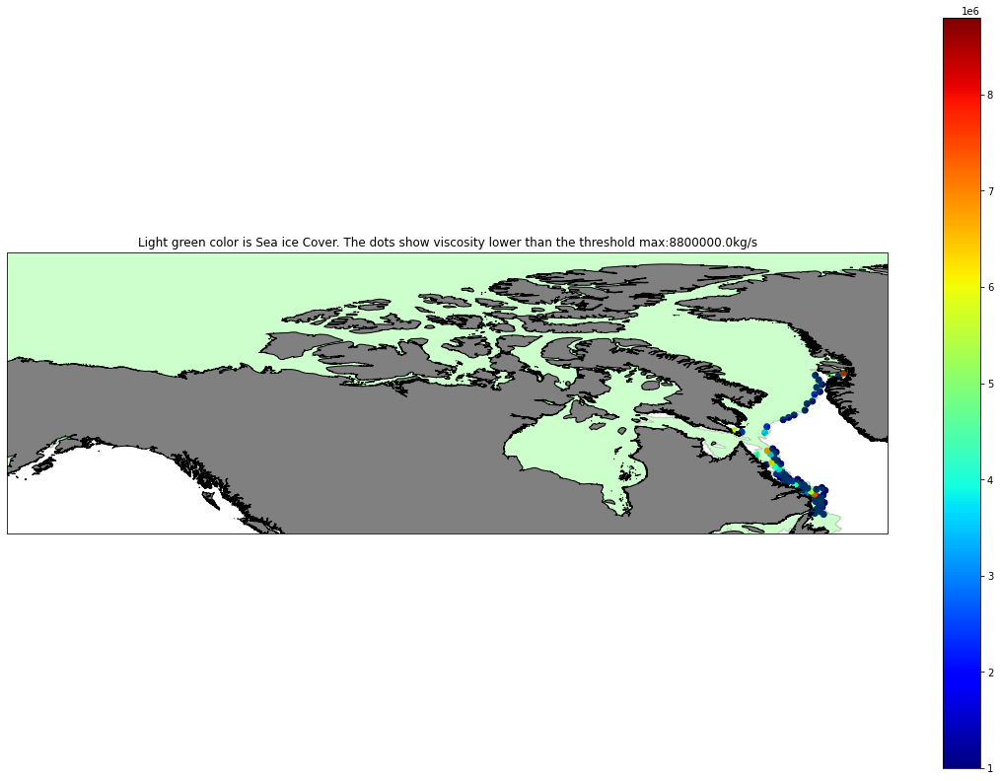

In [17]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
cont=ax1.scatter(icepollonpointvec[visindex],icepollatpointvec[visindex],c=etaivecall[visindex],transform=ccrs.PlateCarree(),vmin=1e06,vmax=mu_max,cmap='jet')
# ax1.legend()
# plt.colorbar(cont)
# cont=ax1.scatter(icepollonpointvec[:],icepollatpointvec[:],c=etaivecall[:],transform=ccrs.PlateCarree(),vmin=1e06,vmax=mu_max,cmap='jet')

plt.colorbar(cont)
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
plt.title('Light green color is Sea ice Cover. The dots show viscosity lower than the threshold max:'+str(mu_max)+'kg/s')
plt.savefig('Ice Parameters/Viscosity/Viscosity_value_'+month+'.jpg',dpi=300)


Now we volume average the viscosity in above poiitn.s for this we need bathymetry at each point.


In [18]:
netcanda='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/snelliusmodels/basic_test_model/stochModel/input_model/gtsm__canada_2_net.nc'
netdata=xr.open_dataset(netcanda)
print(netdata)
netx=netdata.NetNode_x.values
nety=netdata.NetNode_y.values
Hbathy=netdata.NetNode_z.values
#may be better if nan values to put it to zero.
Hbathy=np.where((np.isnan(Hbathy)==True),0,Hbathy)
#we use a linear interpolator now because it is more accurate and less chances of point being on land. 
from scipy.interpolate import griddata
# interpfunc=griddata(list(zip(netx,nety)),Hbathy,list(zip(netx,nety)))
Hvec=griddata(list(zip(netx,nety)),Hbathy,list(zip(icepollonpointvec[visindex],icepollatpointvec[visindex])),method='cubic')
#nan values occur for points outside the grid. so at these points we use nearest nd interpolator.
interpfunc=NearestNDInterpolator(list(zip(netx,nety)),Hbathy,list(zip(netx,nety)))
Hvecnearest=interpfunc(icepollonpointvec[visindex],icepollatpointvec[visindex])
Hvecf=np.where(np.isnan(Hvec)==True,Hvecnearest,Hvec)
#where Hvecf is positive we set it as -e^16.
posindex=np.where(Hvecf>0.0)
Hvecf=np.where(Hvecf>0.0,-1e16,Hvecf)
#important this is the fill value type.

<xarray.Dataset>
Dimensions:      (nNetLink: 560343, nNetLinkPts: 2, nNetNode: 278376)
Coordinates:
    NetNode_x    (nNetNode) float64 ...
    NetNode_y    (nNetNode) float64 ...
Dimensions without coordinates: nNetLink, nNetLinkPts, nNetNode
Data variables:
    Mesh2D       int32 ...
    wgs84        int32 ...
    NetNode_z    (nNetNode) float64 ...
    NetLink      (nNetLink, nNetLinkPts) int32 ...
    NetLinkType  (nNetLink) int32 ...
Attributes:
    institution:    Deltares
    references:     http://www.deltares.nl
    source:         Deltares, D-Flow FM Version 1.2.59.64338M, Jul 19 2019, 1...
    history:        Created on 2021-07-21T17:40:42+0200, D-Flow FM
    date_created:   2021-07-21T17:40:42+0200
    date_modified:  2021-07-21T17:40:42+0200
    Conventions:    UGRID-0.9


In [19]:
#viscosity points.

#Now volume average this viscosity with rho_i and H
rho_i=920.
visvaluaveraged=-etaivecall[visindex]/(rho_i*Hvecf)
print(visvaluaveraged)
visvaluepointvec=np.zeros(len(icepid))
visvaluepointvec[visindex]=visvaluaveraged

[1.18883009e+00 4.08807187e-02 1.10619743e+00 3.97983963e-02
 9.36110331e-15 1.51419402e+00 4.03659721e+00 2.78612466e-03
 2.44484303e+00 6.26477969e-02 2.34771899e-01 4.21300988e+00
 1.38678967e+01 1.24184170e-04 5.99196656e+01 2.91932664e+01
 2.68520903e+01 1.36852046e-07 1.33926260e+01 5.00517879e-01
 3.52606039e-01 3.86584957e-07 1.76565594e+01 7.85322537e-05
 1.59176505e+01 1.56987593e+00 1.87114844e-04 1.40993533e+01
 2.47811813e+00 3.27263356e-04 3.99542719e-02 2.04630778e+00
 2.86265781e-01 2.74449666e+00 4.99441122e+00 3.08704188e+01
 3.06570152e+01 1.00661801e+01 9.07510206e-07 4.13101374e+01
 1.94467423e-05 2.56193609e-02 2.54467825e+01 1.89017285e+01
 2.78313113e-09 4.00390853e+01 1.26282456e-07 6.88298509e+00
 6.83892741e+00 2.32146734e+01 3.54033461e+00 1.95189105e-05
 1.66936744e-04 1.11580937e-02 3.03227943e-02 2.19647535e-03
 7.60935980e-06 1.41289538e+01 1.55739389e-01 1.31027729e+01
 9.18057793e-05 1.24053846e-01 7.30426485e-16 3.44793648e-01
 1.65478639e-02 1.822465

In [15]:
#save the viscosity value file.
visfname='Ice Parameters/Viscosity/viscosityval_20200315_v4.xyz'
vec=np.vstack((icepollonpointvec,icepollatpointvec))
vec=np.vstack((vec,visvaluepointvec.reshape((1,len(visvaluepointvec)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec[2,:]=1.0 #starting with 1.0 as the multiplier.
# np.savetxt(visfname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

NameError: name 'visvaluepointvec' is not defined

Next we obtain the fast ice part.

In [21]:
#now we obtain the fast ice part. 
etaivecall=np.zeros(len(icepid))
etaivecall[inicepolindex]=etaivec
#getting mu_max index
ficeindex=np.where(etaivecall>=mu_max)[0]


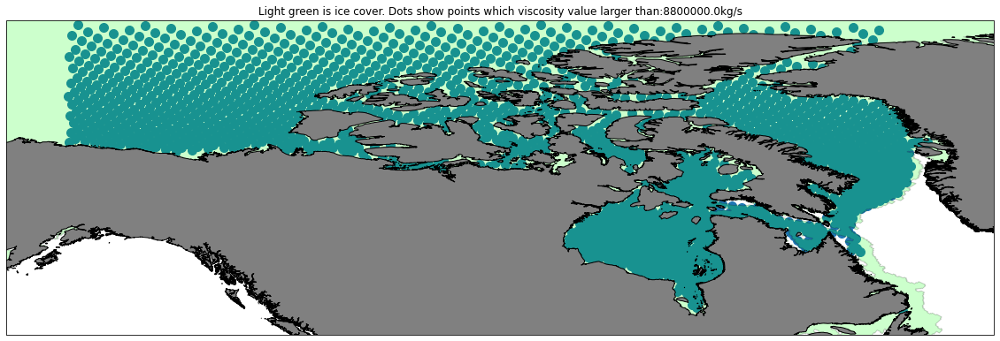

In [22]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
cont=ax1.scatter(icepollonpointvec[ficeindex],icepollatpointvec[ficeindex],transform=ccrs.PlateCarree(),s=100)

# ax1.legend()
# plt.colorbar(cont)
# cont=ax1.scatter(icepollonpointvec[:],icepollatpointvec[:],c=etaivecall[:],transform=ccrs.PlateCarree(),vmin=1e06,vmax=mu_max,cmap='jet')

shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
plt.title('Light green is ice cover. Dots show points which viscosity value larger than:'+str(mu_max)+'kg/s')
plt.savefig('Ice Parameters/Fastice_friction/fice_points_'+month+'.jpg',dpi=300)


The above areas are classified as fast ice areas and modelled accordingly. 

In [29]:
# ficeparamid=100*np.ones(len(icepid)).astype(int)
# ficeparamid[ficeindex]=1 
ficefname='Ice Parameters/Fastice_friction/fice_distribution_'+month+'_v1.xyz'
vec=np.vstack((icepollonpointvec,icepollatpointvec))
# vec=np.vstack((vec,ficeparamid.reshape((1,len(ficeparamid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec[2,:]=1.0 #starting with 1.0 as the multiplier.
# np.savetxt(ficefname,vec.T,fmt=['%0.2f','%0.2f','%d'],delimiter='\t')

Now we plot the fast ice and viscosity points to check if they do not fall on each other and other random checks. But before that, note that we have studied this 
in detail and modified some points which we believe were spurious. to make things more coherrent. The figure with name (classification_initial) tells you the initial distribution.


In [48]:
#Now load the vis distribution and fast ice files again and check for the distribution.
headerlist=['Lon','Lat','pid']
visdf=pd.read_csv(visfname,names=headerlist,delim_whitespace=True)
ficedf=pd.read_csv(ficefname,names=headerlist,delim_whitespace=True)
# icepollonpointvec=np.array(df['Lon'])
# icepollatpointvec=np.array(df['Lat'])
visicevec=np.array(visdf['pid'])
visindex=np.where(visicevec>0.0)[0]
#fice
ficevec=np.array(ficedf['pid'])
ficeindex=np.where(ficevec==1)[0]
#now based on paramid, we  get the index of all the inpolygon points.


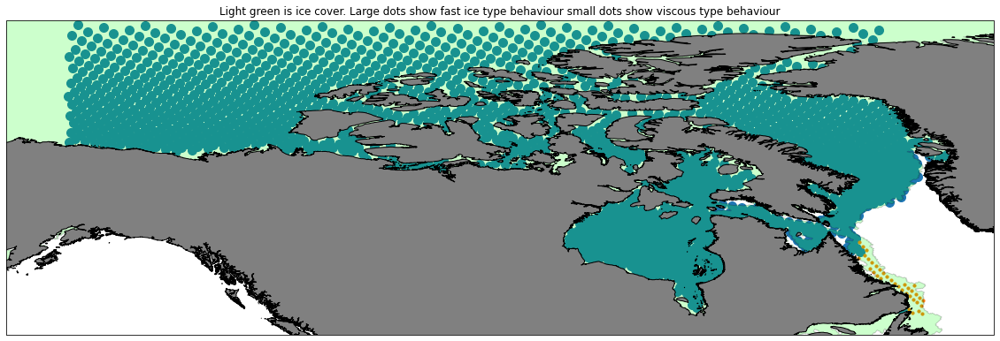

In [50]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
#Initial
# cont=ax1.scatter(icepollonpointvec[np.append(ficeindex,121)],icepollatpointvec[np.append(ficeindex,121)],transform=ccrs.PlateCarree(),s=100)
# cont=ax1.scatter(icepollonpointvec[visindex],icepollatpointvec[visindex],transform=ccrs.PlateCarree(),s=10)
#Modified
cont=ax1.scatter(icepollonpointvec[ficeindex],icepollatpointvec[ficeindex],transform=ccrs.PlateCarree(),s=100)
cont=ax1.scatter(icepollonpointvec[visindex],icepollatpointvec[visindex],transform=ccrs.PlateCarree(),s=10)
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
plt.title('Light green is ice cover. Large dots show fast ice type behaviour small dots show viscous type behaviour')
plt.savefig('Ice Parameters/classification_ice_points_'+month+'.jpg',dpi=300)

In [51]:
# # #below is the code to identify the index of the spurious points based on QGIS derived lon lat.
# ind=np.where(icepollonpointvec[visindex]<-62.5)[0]
# ind2=np.where(icepollatpointvec[visindex]>59.0)[0]
# print(ind,ind2)
# icepollonpointvec[visindex][ind],icepollatpointvec[visindex][ind2]

One we have the distributions, we create the polygons of parameters.  We create a parameter files for sea ice. We use the same squares we had before. but that makes it complex. so we decide to use qgis again and create polygons there.
**Start with Viscosity**

In [52]:
if month=='Sep':
#sept
    poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Parameters/Ice Parameters/Viscosity/new_concept_vispolygon_sep/vis_param_polygon.csv')
    Npol=4
#mar
else:
    poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Parameters/Ice Parameters/Fastice_friction/new_fastice_polygon_mar/vis_param_polygon.csv')
    Npol=1
poldf.head()
poldf.id.values

array([1, 1, 1, 1, 1])

In [53]:
Lonvec=poldf['X']
Latvec=np.array(poldf['Y'])

idvec=poldf['id']
vindexvec=poldf['vertex_index']
polydict={}
for id in range(Npol):
    id=id+1 #as the ids start from 1
    idindex=np.where(idvec==id)[0]
    coords=[]
    for i in range(len(idindex)):
        coords.append((Lonvec[idindex[i]],Latvec[idindex[i]]))
    poly=Polygon(coords)
    polydict[id]=poly

In [54]:
#check if a point lies in a polygon and in viscouss sea ice.. If so, assign the point a value of parameter corresponding to polygon id and the other points a parameter
# id corresponding to 100.
visparamid=[]
#now visindex gives points in viscosity domain.
vislonpointvec=icepollonpointvec[visindex]
vislatpointvec=icepollatpointvec[visindex]
for i in range(len(vislonpointvec)):
    point=Point(vislonpointvec[i],vislatpointvec[i])
    count=0
    for keys in polydict:
        poly=polydict[keys]
        if poly.contains(point):
            visparamid=np.append(visparamid,keys)
            count=1
    if count==0:
        visparamid=np.append(visparamid,100)
        print('Point not contained in any polyon')
        print(point)

In [55]:
visparamall=100*np.ones(len(icepollonpointvec)).astype(int)
visparamall[visindex]=visparamid
visparamfname='Ice Parameters/Viscosity/viscosity_correction_'+month+'_template_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(visparamall) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((icepollonpointvec[sortind],icepollatpointvec[sortind]))
vec=np.vstack((vec,visparamall[sortind].reshape((1,len(visparamall)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
#no inpolindex required here.
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
np.savetxt(visparamfname,vec.T,fmt=['%0.2f','%0.2f','%d'],delimiter='\t')

[[ -60.10718  -58.13506  -55.30885 ...  -73.22102  -62.63095 -149.93757]
 [  56.52285   55.60126   53.95995 ...   64.06562   63.96623   84.20245]
 [   1.         1.         1.      ...  100.       100.       100.     ]]


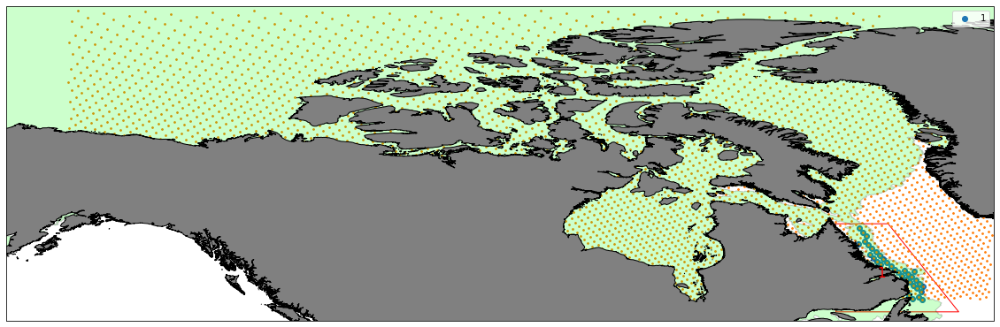

In [56]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
for keys in polydict:
    ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
    x=polydict[keys].centroid.x
    y=polydict[keys].centroid.y
    ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
    #getting points in polygon. from paramid.
    indparam=np.where(vec[2,:]==keys)[0]
    print(vec)
    ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
ax1.scatter(icepollonpointvec,icepollatpointvec,transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
fig.savefig('Ice Parameters/Viscosity/Param_Polygon_'+month+'v3.jpg',dpi=1000)
# plt.show()

Finally we create a correction file.

In [57]:
viscorrfname='Ice Parameters/Viscosity/viscosity_correction_'+month+'_'+str(Npol)+'_v4.xyz'
sortind=np.argsort(visparamall) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((icepollonpointvec[sortind],icepollatpointvec[sortind]))
vec=np.vstack((vec,visparamall[sortind].reshape((1,len(visparamall)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
vec[2,:]=1.0 #starting with 1.0 as the multiplier.

np.savetxt(viscorrfname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

Now we do the same for fast ice type ice.

In [63]:
if month=='Sep':
#sept
    poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Parameters/Ice Parameters/Fastice_friction/new_fastice_polygon_sept/fice_param_polyon.csv')
    Npol=3
#mar
else:
    poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Parameters/Ice Parameters/Fastice_friction/new_fastice_polygon_mar/fastice_param_polygons.csv')
    Npol=16

poldf.head()
poldf.id.values

array([ 1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  4,  4,
        4,  4,  4,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  7,  7,  7,  7,
        7,  8,  8,  8,  8,  8,  9,  9,  9,  9,  9, 10, 10, 10, 10, 10, 11,
       11, 11, 11, 11, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 14, 14, 14,
       14, 14, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16])

In [64]:
Lonvec=np.array(poldf['X'])
Latvec=np.array(poldf['Y'])

idvec=poldf['id']
vindexvec=poldf['vertex_index']
polydict={}
for id in range(Npol):
    id=id+1 #as the ids start from 1
    idindex=np.where(idvec==id)[0]
    coords=[]
    for i in range(len(idindex)):
        coords.append((Lonvec[idindex[i]],Latvec[idindex[i]]))
    poly=Polygon(coords)
    polydict[id]=poly

In [65]:
#check if a point lies in a polygon and in fast type ice.  If so, assign the point a value of parameter corresponding to polygon id and the other points a parameter
# id corresponding to 100.
ficeparamid=[]
#now ficeindex gives points in fastice domain.
ficelonpointvec=icepollonpointvec[ficeindex]
ficelatpointvec=icepollatpointvec[ficeindex]
for i in range(len(ficelonpointvec)):
    point=Point(ficelonpointvec[i],ficelatpointvec[i])
    count=0
    for keys in polydict:
        poly=polydict[keys]
        if poly.contains(point):
            ficeparamid=np.append(ficeparamid,keys)
            count=1
    if count==0:
        ficeparamid=np.append(ficeparamid,100)
        print('Point not contained in any polyon')
        print(point)

Point not contained in any polyon
POINT (-56.36457 51.64731)
Point not contained in any polyon
POINT (-141.35813 74.00696000000001)
Point not contained in any polyon
POINT (-149.02118 74.05069)
Point not contained in any polyon
POINT (-136.62211 74.07782)
Point not contained in any polyon
POINT (-144.28515 74.12174)
Point not contained in any polyon
POINT (-131.88609 74.14899)
Point not contained in any polyon
POINT (-139.54913 74.1931)
Point not contained in any polyon
POINT (-147.21218 74.23733)
Point not contained in any polyon
POINT (-134.81311 74.26477)
Point not contained in any polyon
POINT (-142.47615 74.3092)
Point not contained in any polyon
POINT (-130.07709 74.33677)
Point not contained in any polyon
POINT (-150.1392 74.35375000000001)
Point not contained in any polyon
POINT (-137.74013 74.38139)
Point not contained in any polyon
POINT (-145.40318 74.42615000000001)
Point not contained in any polyon
POINT (-133.00411 74.45390999999999)
Point not contained in any polyon
POIN

In [66]:
ficeparamall=100*np.ones(len(icepollonpointvec)).astype(int)
ficeparamall[ficeindex]=ficeparamid
ficeparamfname='Ice Parameters/Fastice_friction/fice_correction_'+month+'_template_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(ficeparamall) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((icepollonpointvec[sortind],icepollatpointvec[sortind]))
vec=np.vstack((vec,ficeparamall[sortind].reshape((1,len(ficeparamall)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
#no inpolindex required here.
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
np.savetxt(ficeparamfname,vec.T,fmt=['%0.2f','%0.2f','%d'],delimiter='\t')

[[-133.7959  -132.84099 -140.50404 ...  -73.12021  -53.74907 -149.93757]
 [  70.92915   72.46731   72.5073  ...   66.24345   65.90298   84.20245]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-133.7959  -132.84099 -140.50404 ...  -73.12021  -53.74907 -149.93757]
 [  70.92915   72.46731   72.5073  ...   66.24345   65.90298   84.20245]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-133.7959  -132.84099 -140.50404 ...  -73.12021  -53.74907 -149.93757]
 [  70.92915   72.46731   72.5073  ...   66.24345   65.90298   84.20245]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-133.7959  -132.84099 -140.50404 ...  -73.12021  -53.74907 -149.93757]
 [  70.92915   72.46731   72.5073  ...   66.24345   65.90298   84.20245]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-133.7959  -132.84099 -140.50404 ...  -73.12021  -53.74907 -149.93757]
 [  70.92915   72.46731   72.5073  ...   66.243

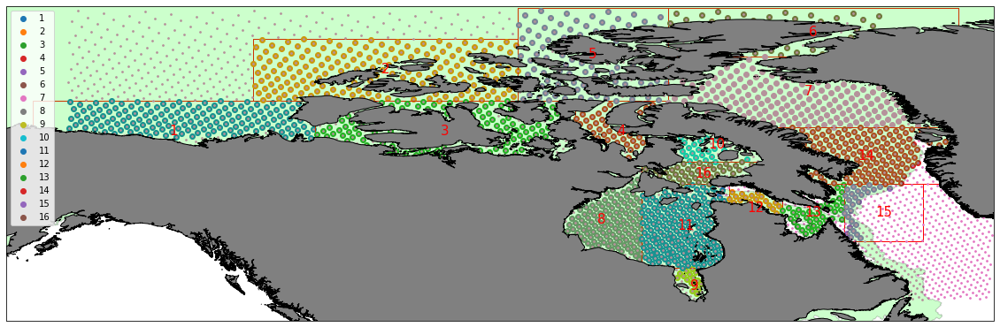

In [67]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
for keys in polydict:
    ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
    x=polydict[keys].centroid.x
    y=polydict[keys].centroid.y
    ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
    #getting points in polygon. from paramid.
    indparam=np.where(vec[2,:]==keys)[0]
    print(vec)
    ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
ax1.scatter(icepollonpointvec,icepollatpointvec,transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
fig.savefig('Ice Parameters/Fastice_friction/Param_Polygon_'+month+'v1.jpg',dpi=1000)
# plt.show()

In [68]:

ficecorrfname='Ice Parameters/Fastice_friction/fice_correction_'+month+'_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(ficeparamall) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((icepollonpointvec[sortind],icepollatpointvec[sortind]))
vec=np.vstack((vec,ficeparamall[sortind].reshape((1,len(ficeparamall)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
vec[2,:]=1.0 #starting with 1.0 as the multiplier.

np.savetxt(ficecorrfname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

But for fast ice we still need a correction value. This value should be at the same points as in correction for the py script to work correctly. That is why, we create the initial value file now.

In [69]:
ficeinitialall=0.0*np.ones(len(icepollonpointvec)).astype(int)
ficeinitialall[ficeindex]=42.2 #chezzy value with 1.0 as starting multiplier in correction,
ficeinitialfname='Ice Parameters/Fastice_friction/ficeval_initial_'+month+'_v1.xyz'
sortind=np.argsort(ficeparamall) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((icepollonpointvec[sortind],icepollatpointvec[sortind]))
vec=np.vstack((vec,ficeinitialall[sortind].reshape((1,len(ficeinitialall)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
#no inpolindex required here.
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
np.savetxt(ficeinitialfname,vec.T,fmt=['%0.2f','%0.2f','%0.2f'],delimiter='\t')

Trying to plot the fast ice and other regions with triangulation.

In [75]:
from postprocessing import readdata


In [76]:
triang=readdata.gettriangulation(icepollonpointvec,icepollatpointvec)

In [ ]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
for keys in polydict:
    ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
    x=polydict[keys].centroid.x
    y=polydict[keys].centroid.y
    ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
    #getting points in polygon. from paramid.
    indparam=np.where(vec[2,:]==keys)[0]
    print(vec)
    
    triang=readdata.gettriangulation(vec[0,indparam],vec[1,indparam])
    ax1.triplot(vec[0,indparam], vec[1,indparam], triang.simplices,transform=ccrs.PlateCarree(),label=str(keys))
    # ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
# ax1.scatter(icepollonpointvec,icepollatpointvec,transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
# fig.savefig('Ice Parameters/Fastice_friction/Param_Polygon_'+month+'v1.jpg',dpi=1000)